In [47]:
# prerequisites
import os 
import numpy as np 
import networkx as nx
import matplotlib.pyplot as plt 
import warnings 
import funcs
from networkx.algorithms import community

warnings.simplefilter('ignore')

In [48]:
# read the network details
def readNet(fileName):
    f = open(fileName, "r")
    net = {}
    n = int(f.readline())
    net['noNodes'] = n
    mat = []
    for i in range(n):
        mat.append([])
        line = f.readline()
        elems = line.split(" ")
        for j in range(n):
            mat[-1].append(int(elems[j]))
    net["mat"] = mat 
    degrees = []
    noEdges = 0
    for i in range(n):
        d = 0
        for j in range(n):
            if (mat[i][j] == 1):
                d += 1
            if (j > i):
                noEdges += mat[i][j]
        degrees.append(d)
    net["noEdges"] = noEdges
    net["degrees"] = degrees
    f.close()
    return net

In [49]:
# plot a network 
def plotNetwork(network, communities = [1, 1, 1, 1, 1, 1]):
    np.random.seed(123) #to freeze the graph's view (networks uses a random view)
    A=np.matrix(network["mat"])
    G=nx.from_numpy_matrix(A)
    pos = nx.spring_layout(G)  # compute graph layout
    plt.figure(figsize=(4, 4))  # image is 8 x 8 inches 
    nx.draw_networkx_nodes(G, pos, node_size=600, cmap=plt.cm.RdYlBu, node_color = communities)
    nx.draw_networkx_edges(G, pos, alpha=0.3)
    plt.show(G)

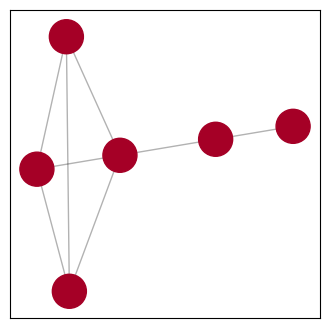

In [50]:
# load a network
crtDir =  os.getcwd()
filePath = os.path.join(crtDir,  'data', 'net.in')
network = readNet(filePath)

#plot the network
plotNetwork(network)

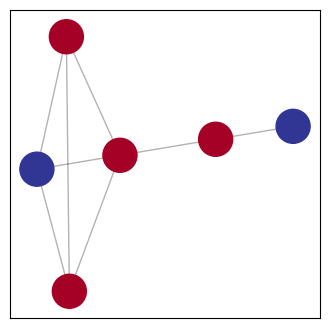

In [51]:
# plot a particular (mock) division in communities
mockCommunities = [1,2,1,2,1, 1]
plotNetwork(network, mockCommunities)

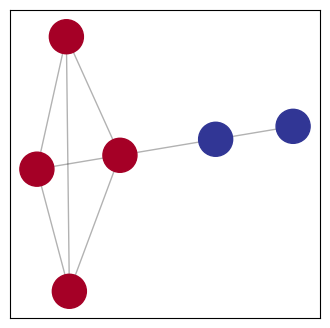

In [52]:
# identify the communities (by a tool) and plot them

def greedyCommunitiesDetectionByTool(network):
    # Input: a graph
    # Output: list of comunity index (for every node)

    from networkx.algorithms import community

    A=np.matrix(network["mat"])
    G=nx.from_numpy_matrix(A)
    communities_generator = community.girvan_newman(G)
    top_level_communities = next(communities_generator)
    sorted(map(sorted, top_level_communities))
    communities = [0 for node in range(network['noNodes'])]
    index = 1
    for community in sorted(map(sorted, top_level_communities)):
        for node in community:
            communities[node] = index
        index += 1
    return communities

plotNetwork(network, greedyCommunitiesDetectionByTool(network))

In [53]:
def draw_graph(G, communities, iterations=1):

    for i in range(iterations-1):
        next(communities)

    node_groups = []
    for com in next(communities):
        node_groups.append(list(com))
 
    print(node_groups)

    color_map = []
    nrcommunities = len(node_groups)
    colors = ['red', 'green', 'blue', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'grey']
    for node in G:
        for i in range(nrcommunities):
            if node in node_groups[i]:
                color_map.append(colors[i])
    plt.figure(figsize=(20,20))
    nx.draw_networkx(G,pos= nx.spring_layout(G), node_color=color_map, with_labels=True)
    plt.show()

['./data/real/dolphins/dolphins.gml', './data/real/football/football.gml', './data/real/karate/karate.gml', './data/real/krebs/krebs.gml']
[['Oscar', 'TR77', 'Bumper', 'Beak', 'Fish', 'PL', 'SN96'], ['Notch', 'DN16', 'DN63', 'SN89', 'SN90', 'Feather', 'Quasi', 'Wave', 'Jet', 'Gallatin', 'Knit', 'Beescratch', 'Web', 'TR82', 'Ripplefluke', 'Mus', 'Number1', 'MN23', 'Zig', 'Upbang', 'DN21'], ['Fork', 'TR88', 'Double', 'Scabs', 'Hook', 'Zap', 'SN63', 'SN9', 'Grin', 'Shmuddel', 'Kringel', 'Whitetip', 'SN4', 'Stripes', 'Thumper', 'CCL', 'TSN103', 'SN100', 'TR99', 'TR120'], ['MN105', 'MN60', 'Patchback', 'Cross', 'Vau', 'MN83', 'Trigger', 'Haecksel', 'SMN5', 'Topless', 'Jonah', 'Five'], ['Zipfel', 'TSN83']]


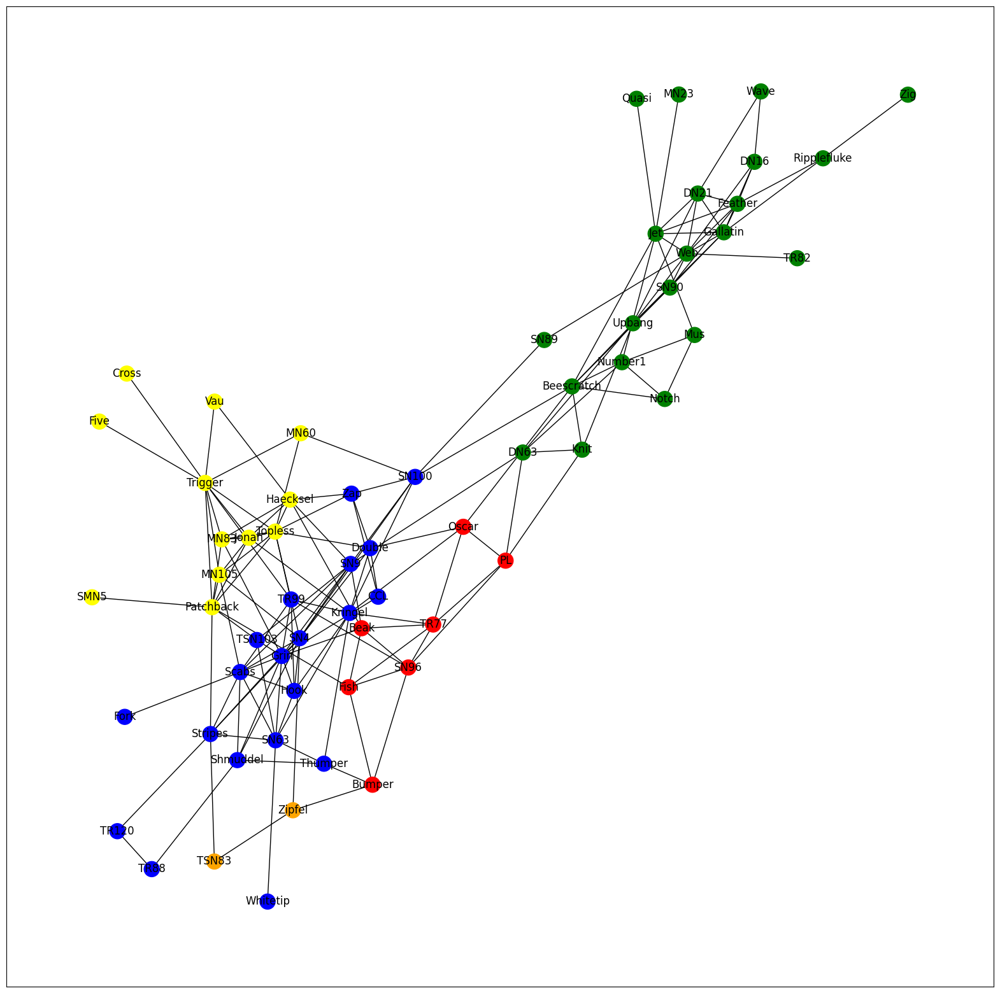

[['NevadaLasVegas', 'Hawaii', 'Texas', 'Nebraska', 'Rice', 'IowaState', 'TexasA&M', 'Wyoming', 'ColoradoState', 'Oregon', 'KansasState', 'NewMexico', 'Oklahoma', 'Arizona', 'TexasTech', 'ArizonaState', 'NewMexicoState', 'Washington', 'TexasChristian', 'California', 'OregonState', 'SanJoseState', 'Tulsa', 'Missouri', 'Utah', 'Baylor', 'TexasElPaso', 'AirForce', 'WashingtonState', 'FresnoState', 'Stanford', 'ArkansasState', 'Kansas', 'BrighamYoung', 'NorthTexas', 'Colorado', 'NotreDame', 'UCLA', 'SouthernCalifornia', 'BoiseState', 'SouthernMethodist', 'Nevada', 'UtahState', 'OklahomaState', 'SanDiegoState', 'Idaho'], ['WakeForest', 'BostonCollege', 'VirginiaTech', 'FloridaState', 'Syracuse', 'Rutgers', 'Pittsburgh', 'WestVirginia', 'NorthCarolina', 'Virginia', 'Navy', 'Duke', 'GeorgiaTech', 'Clemson', 'Temple', 'NorthCarolinaState', 'MiamiFlorida', 'Maryland'], ['Purdue', 'OhioState', 'Minnesota', 'PennState', 'Wisconsin', 'Michigan', 'Northwestern', 'Illinois', 'Iowa', 'MichiganState', 

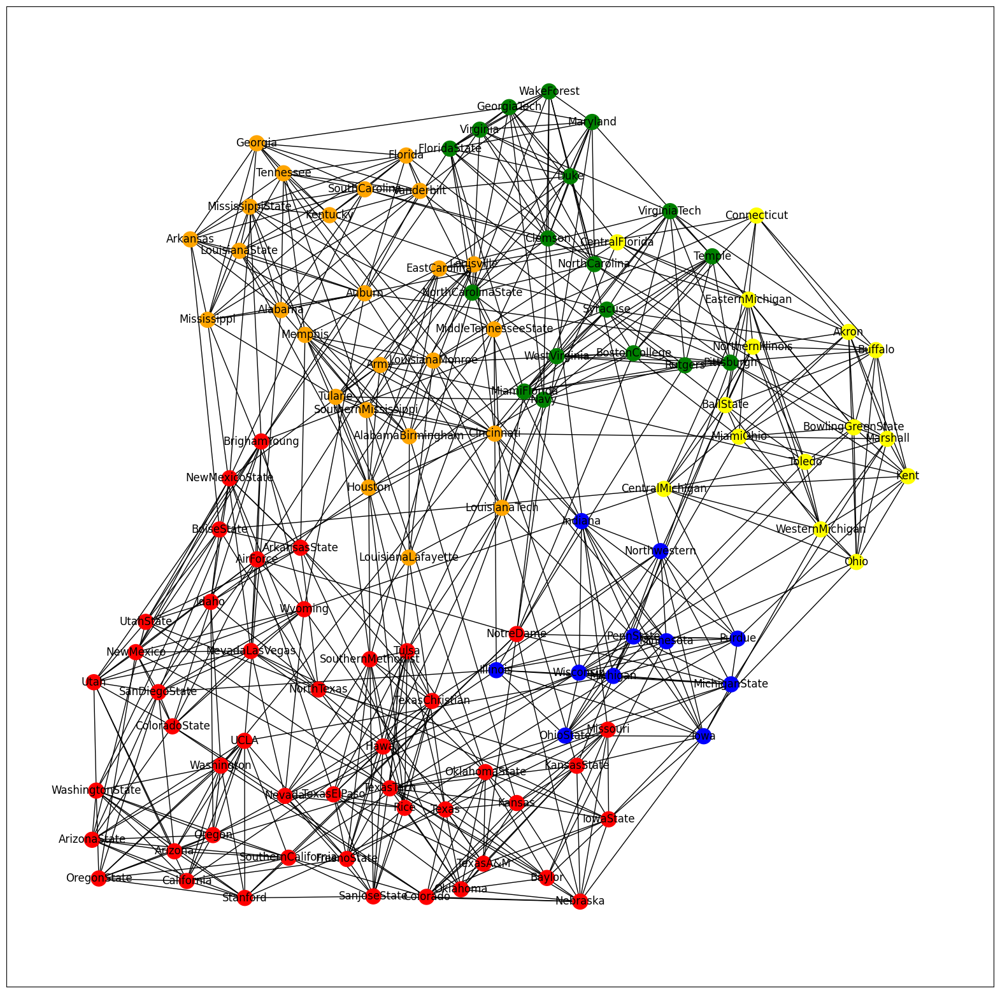

[['4', '13', '14', '1', '2', '20', '22', '12', '18', '8'], ['3', '32', '29', '28', '26', '25'], ['7', '6', '17', '11', '5'], ['21', '16', '30', '34', '31', '27', '15', '19', '24', '23', '33', '9'], ['10']]


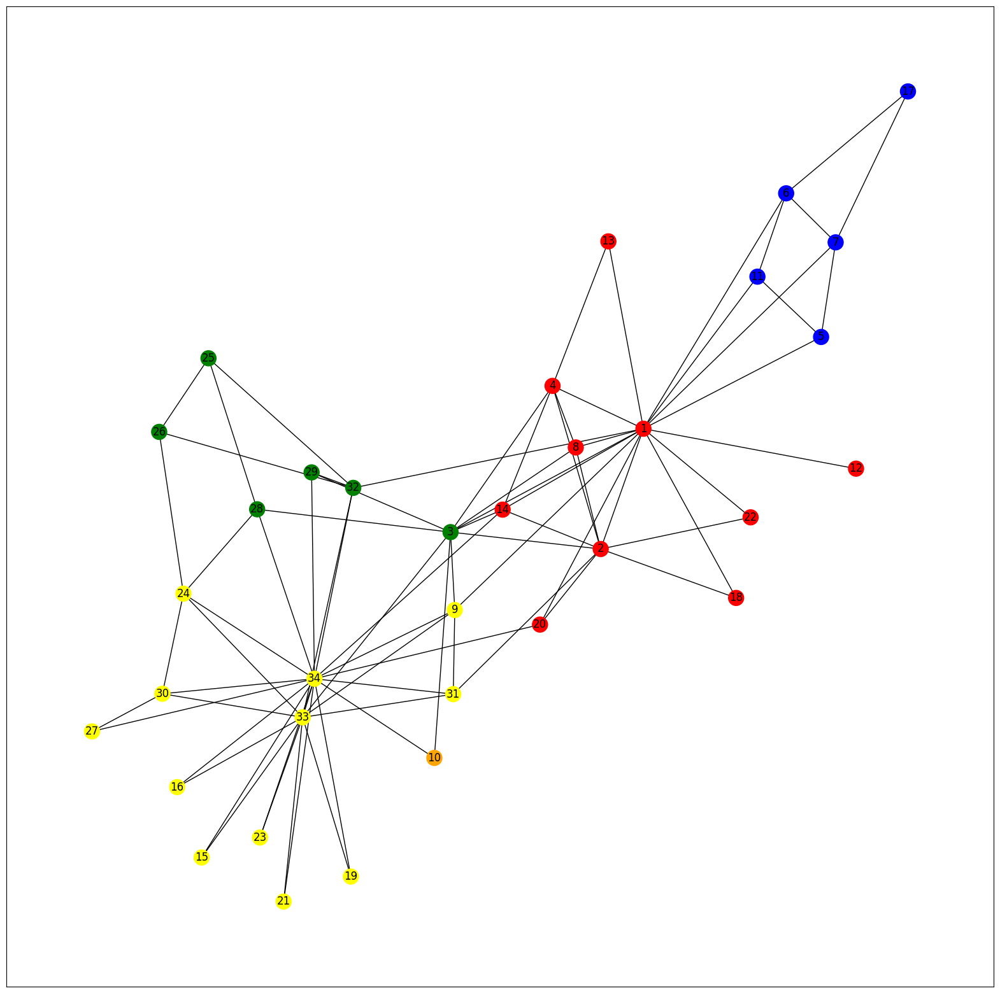

[['Sleeping With the Devil', "Charlie Wilson's War", 'Ghost Wars', 'Dangerous Dimplomacy', 'Why America Slept', 'Bush vs. the Beltway', 'The Man Who Warned America', '1000 Years for Revenge'], ['Fighting Back', 'Spin Sisters', 'Breakdown', 'The Right Man', 'Off with Their Heads', 'We Will Prevail', 'Legacy', 'The Third Terrorist', 'Things Worth Fighting For', 'The Perfect Wife', 'Useful Idiots', 'Meant To Be', 'Hollywood Interrupted', 'A National Party No More', 'Arrogance', "Who's Looking Out for You?", 'The Real America', 'Losing Bin Laden', 'Those Who Trespass', 'The Bushes', 'Tales from the Left Coast', 'Persecution', 'Betrayal', "The O'Reilly Factor", 'Hating America', 'Deliver Us from Evil', 'The French Betrayal of America', 'The Official Handbook Vast Right Wing Conspiracy', 'The Savage Nation', 'Slander', 'Bush Country', 'The Enemy Within', 'Bias', 'The Faith of George W Bush', 'Endgame', 'Shut Up and Sing', 'Give Me a Break', 'Ten Minutes from Normal', 'Let Freedom Ring', 'Pow

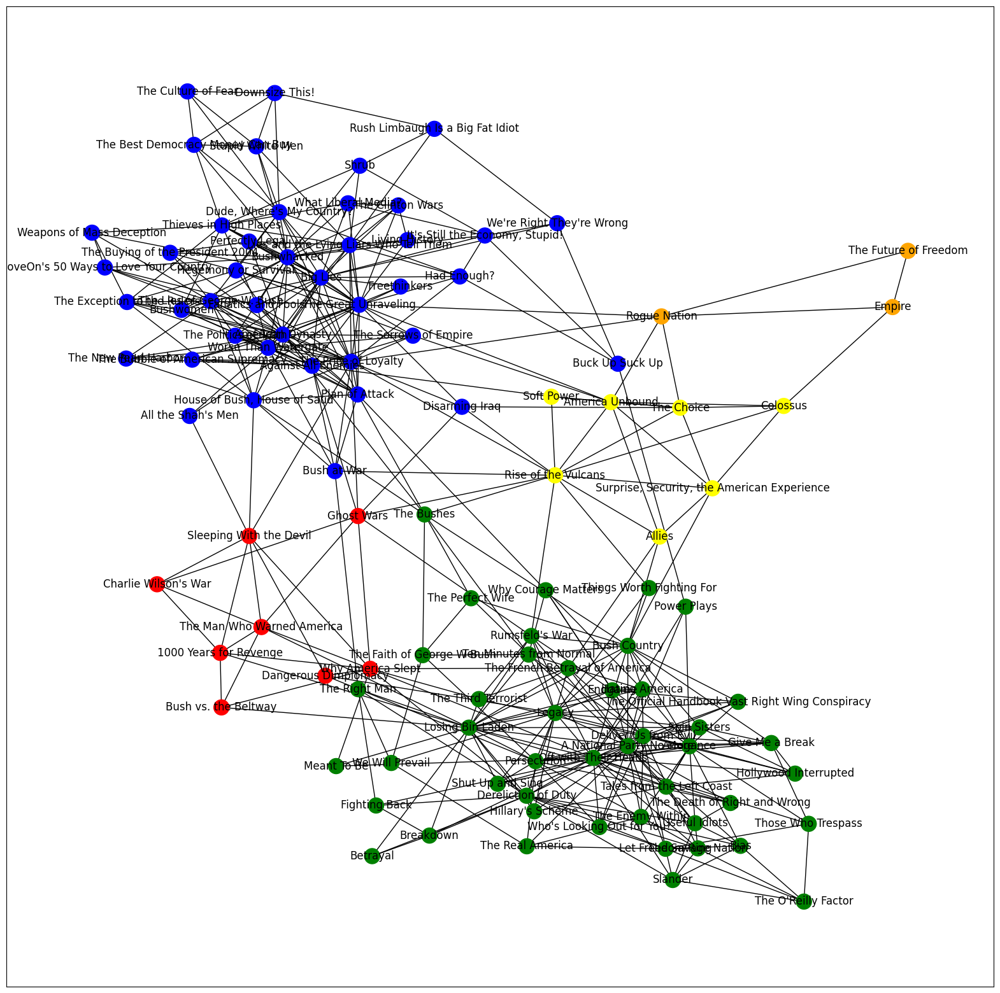

In [54]:
paths = ["./data/real/" + name + "/" + name + ".gml" for name in ["dolphins", "football", "karate", "krebs"]]
print(paths)
for path in paths:
    network = nx.read_gml(path)
    communities = community.girvan_newman(network)

    draw_graph(network, communities,4)

[['A', 'B', 'D', 'E'], ['F', 'C']]


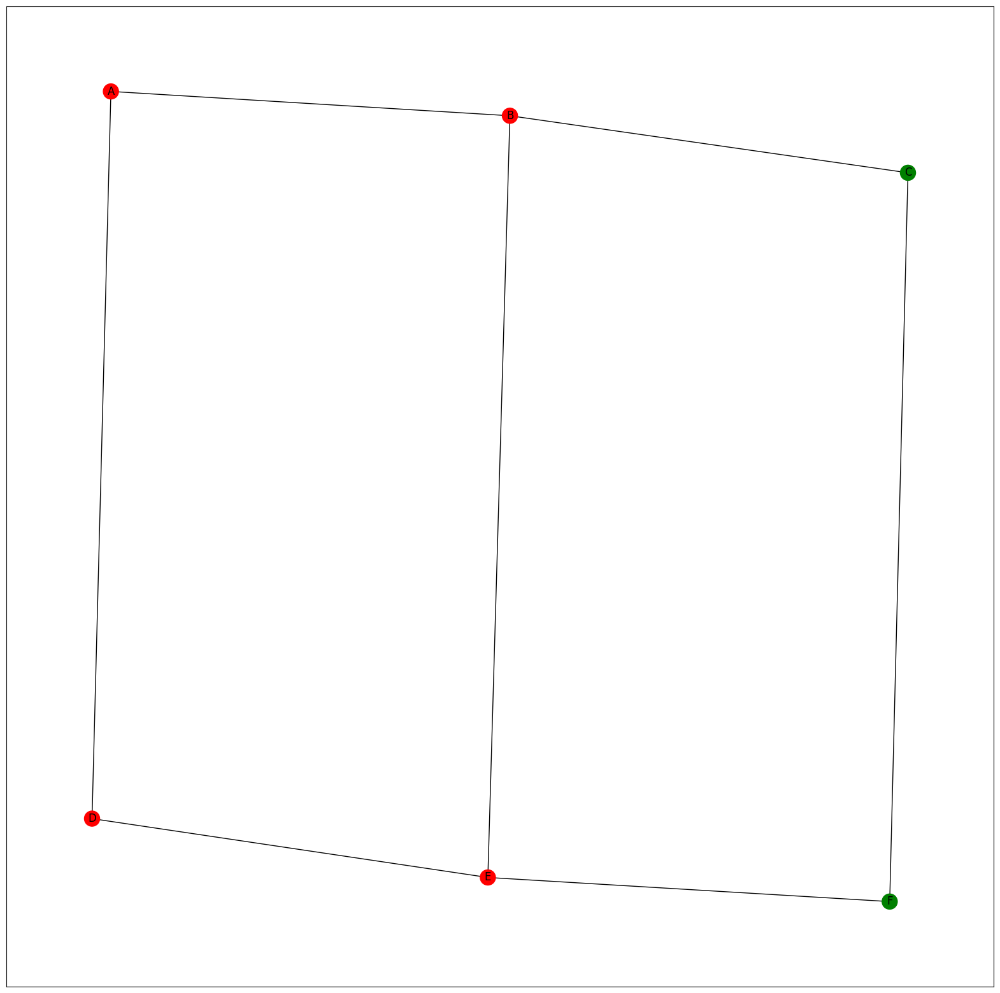

[['4', '3', '7', '6', '2', '0', '12', '8', '5'], ['10', '18', '14', '16', '13', '1', '15', '17', '19', '11', '9']]


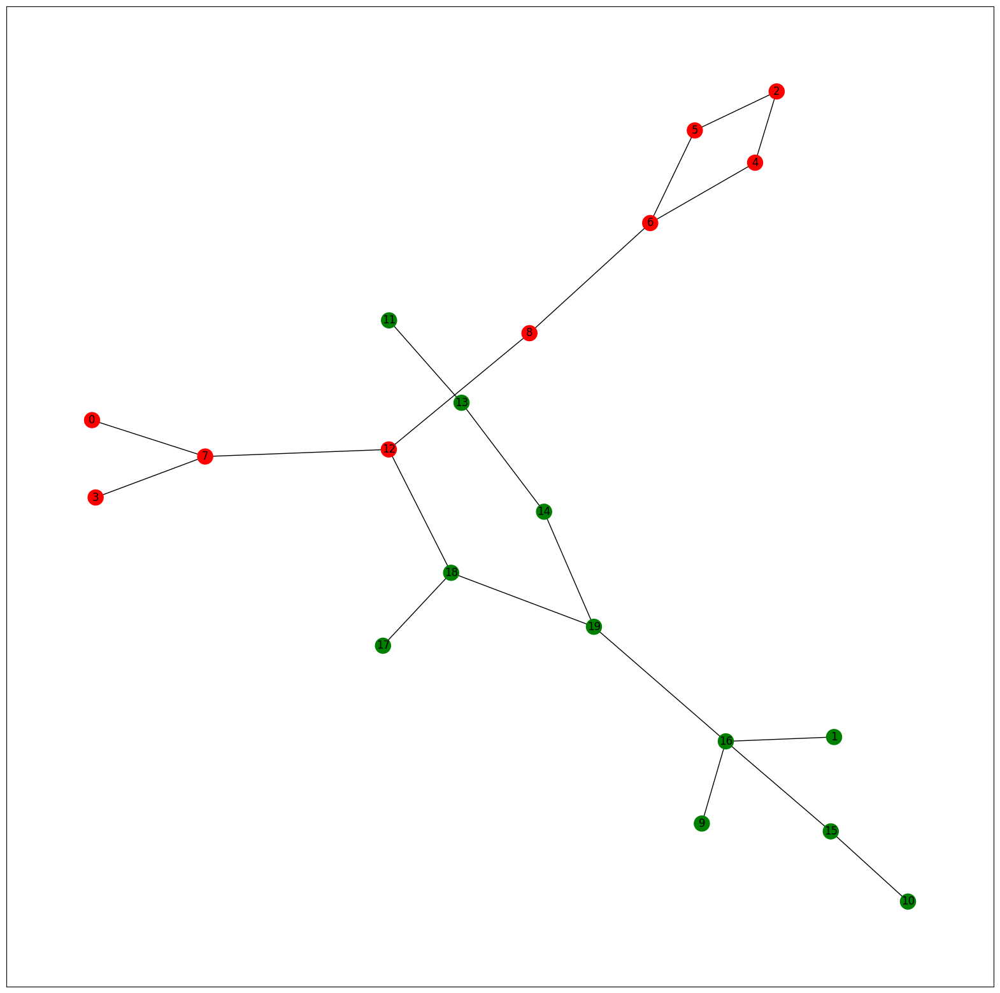

In [55]:
paths=["./data/custom/1s.gml",
       "./data/custom/2s.gml"]
for path in paths:
    network = nx.read_gml(path)
    communities = community.girvan_newman(network)

    draw_graph(network, communities,1)

[['3', '21', '17', '24', '0', '8', '5'], ['13', '28', '30', '1', '31', '7', '32', '15', '19', '2', '20', '23', '22', '18'], ['4', '16', '27', '29', '11', '12', '9', '35', '25'], ['10', '14', '39', '34', '37', '6', '36', '33', '26', '38']]


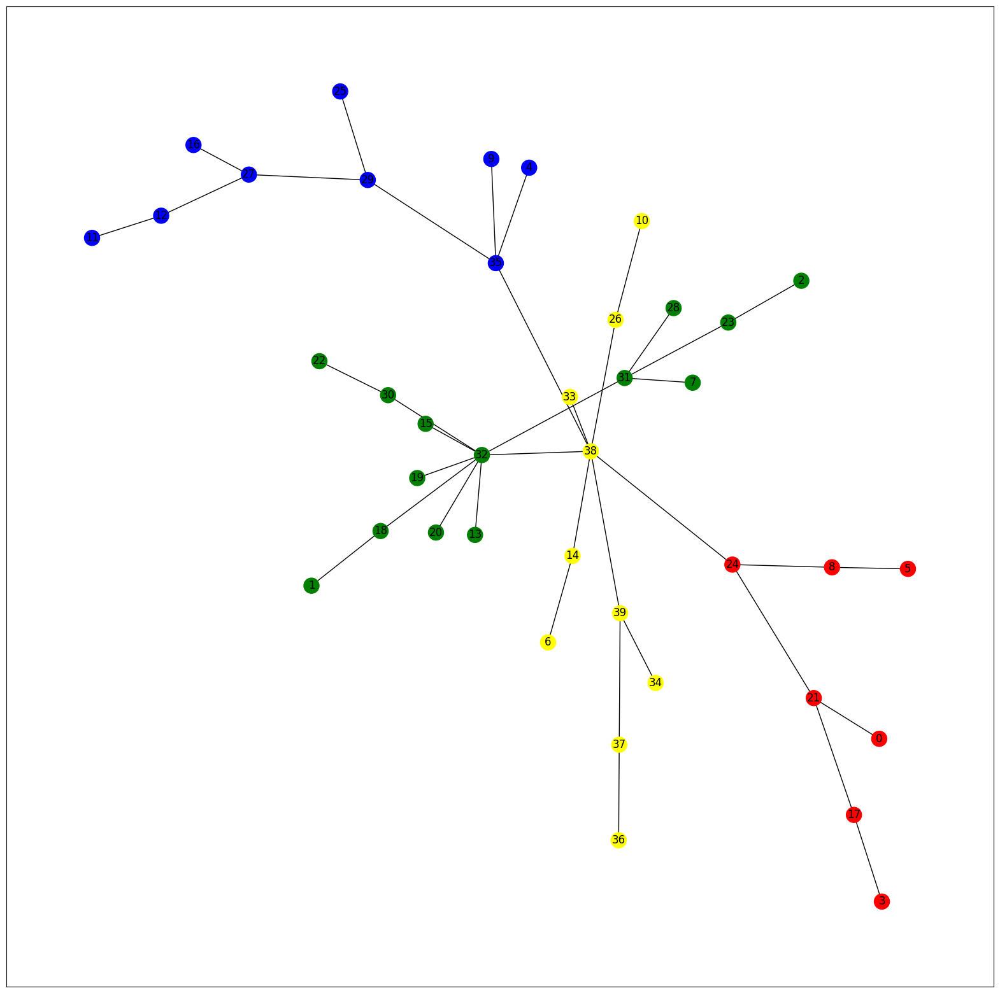

[['58', '99', '57', '41', '48', '53', '95', '15', '56', '24', '79', '11', '38', '88', '98', '93', '84', '19', '46', '16', '61', '31', '96', '45', '86', '76', '29', '92', '47', '89', '10', '30', '42', '0'], ['69', '34', '1', '49', '64', '90', '60', '59', '62', '25', '52', '94', '65', '22', '78', '40', '12', '66', '91', '39', '17', '36', '18', '8', '63', '54', '6', '44', '23', '75'], ['37', '50', '72', '87', '51', '43', '55', '83', '27', '85', '68', '26', '82', '81', '7', '70', '77', '5', '71', '2', '20', '9'], ['4', '3', '21', '13', '73', '14', '67', '80', '32', '74', '97', '33', '28', '35']]


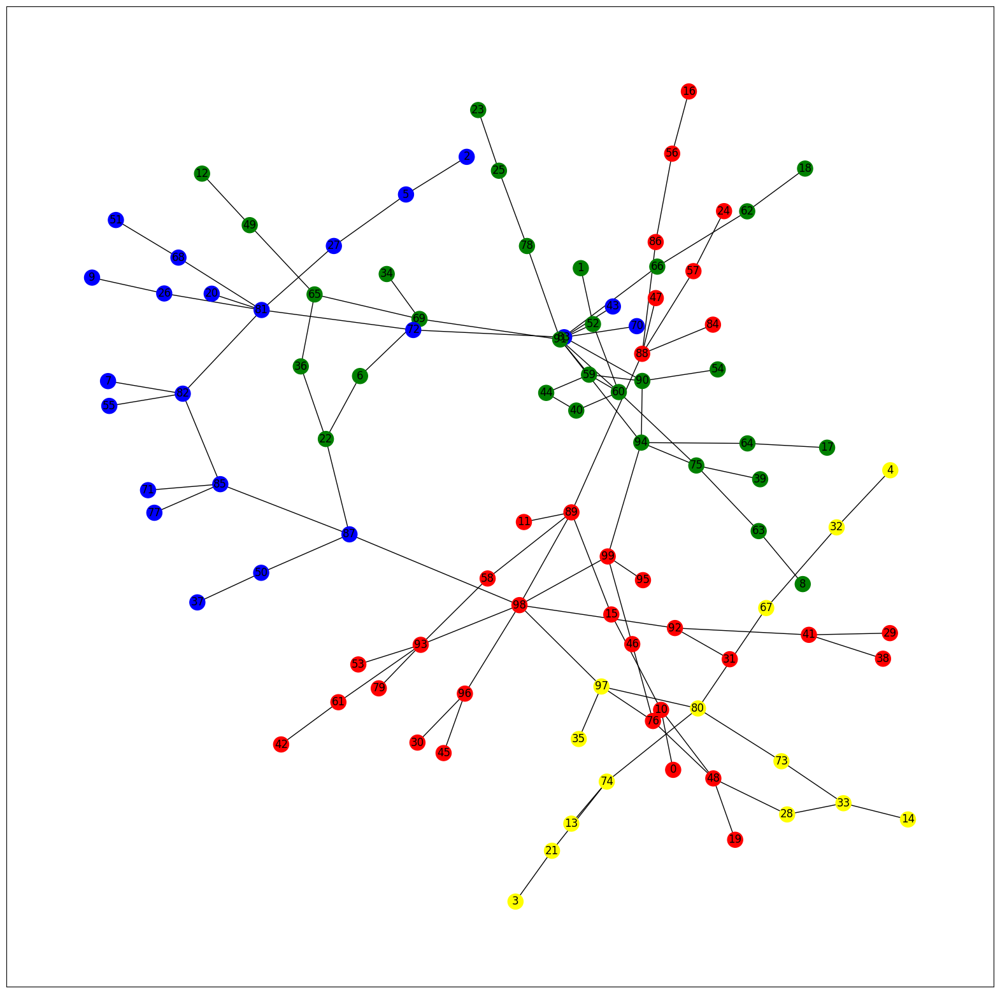

[['728', '812', '360', '48', '67', '1', '37', '918', '456', '525', '445', '513', '493', '739', '700', '629', '247', '206', '135', '88', '87', '795', '851', '303', '263', '657', '694', '661', '624', '997', '236', '491', '607', '710', '608', '261', '66', '887', '843', '273', '776', '170', '591', '316', '573', '47', '753', '278', '551', '980', '820', '396', '998', '616', '613', '919', '454', '56', '570', '241', '752', '406', '36', '782', '705', '166', '194', '620', '560', '988', '230', '920', '508', '756', '578', '875', '240', '248', '152', '14', '759', '472', '856', '504', '671', '676', '232', '542', '369', '699', '895', '119', '568', '853', '681', '280', '110', '10', '459', '500', '345', '702', '718', '991', '989', '617', '506', '565', '900', '198', '798', '145', '69', '420', '366', '462', '814', '385', '389', '346', '929', '297', '334', '402', '546', '453', '486', '365', '352', '439', '25', '292', '27', '837', '632', '322', '460', '419', '284', '786', '221', '992', '886', '897', '218',

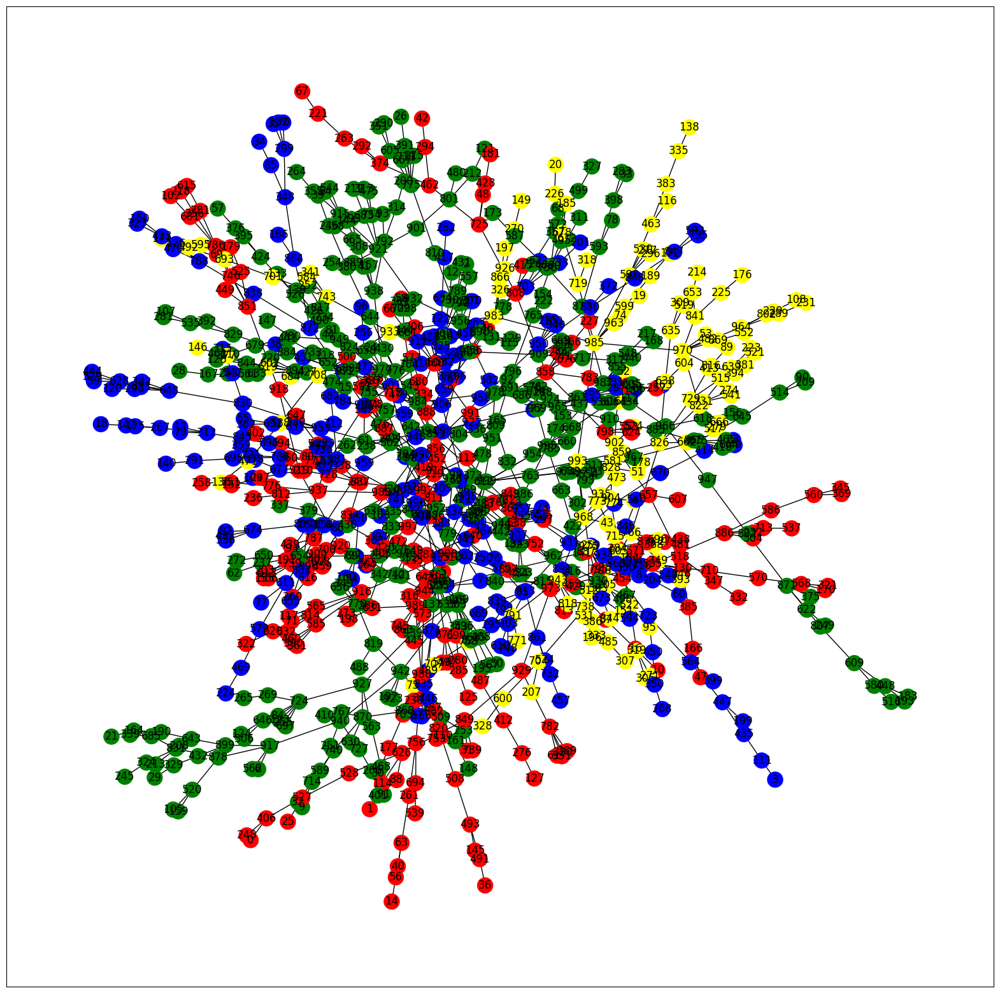

[['41', '48', '34', '1', '49', '37', '15', '24', '11', '43', '25', '13', '27', '32', '19', '22', '26', '40', '12', '46', '3', '21', '14', '16', '39', '31', '7', '45', '17', '36', '29', '47', '18', '8', '35', '5', '4', '10', '30', '6', '44', '2', '23', '20', '0', '33', '9'], ['28'], ['38'], ['42']]


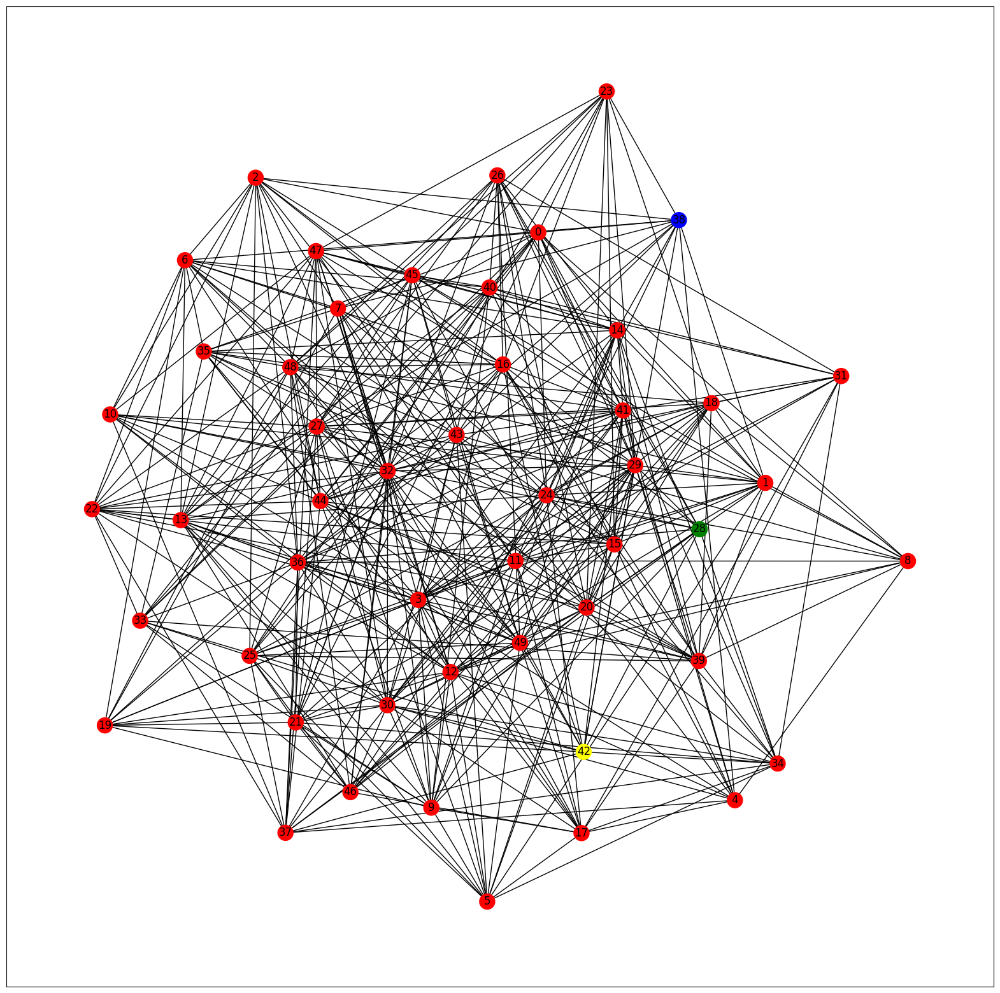

In [56]:
paths = ["./data/custom/1.gml",
         "./data/custom/2.gml",
         "./data/custom/3.gml",
         "./data/custom/4.gml",]
for path in paths:
    network = nx.read_gml(path)
    communities = community.girvan_newman(network)

    draw_graph(network, communities,3)

In [57]:
def edge_to_remove(graph):
    G_dict = funcs.edge_betweenness_centrality(graph)
    edge = ()

    # extract the edge with highest edge betweenness centrality score
    # for key, value in sorted(G_dict.items(), key=lambda item: item[1], reverse=True):
    #     edge = key
    #     break
    edge, value = max(G_dict.items(), key=lambda x: x[1])
    return edge

def gn(graph, num_comms=2):
    # find number of connected components
    sg = nx.connected_components(graph)
    sg_count = nx.number_connected_components(graph)
    
    while sg_count < num_comms:
        graph.remove_edge(edge_to_remove(graph)[0], edge_to_remove(graph)[1])
        sg = nx.connected_components(graph)
        sg_count = nx.number_connected_components(graph)

    return sg


def put_together(communities):
    groups = []
    for community in communities:
        groups.append(list(community))
    return groups

In [58]:
def drawGraph(network, communities):
    color_map = []
    nrcommunities = len(communities)
    colors = ['red', 'green', 'blue', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black', 'grey']
    for node in network:
        for i in range(nrcommunities):
            if node in communities[i]:
                color_map.append(colors[i])
    plt.figure(figsize=(20,20))
    nx.draw_networkx(network,pos= nx.spring_layout(network), node_color=color_map, with_labels=True)
    plt.show()

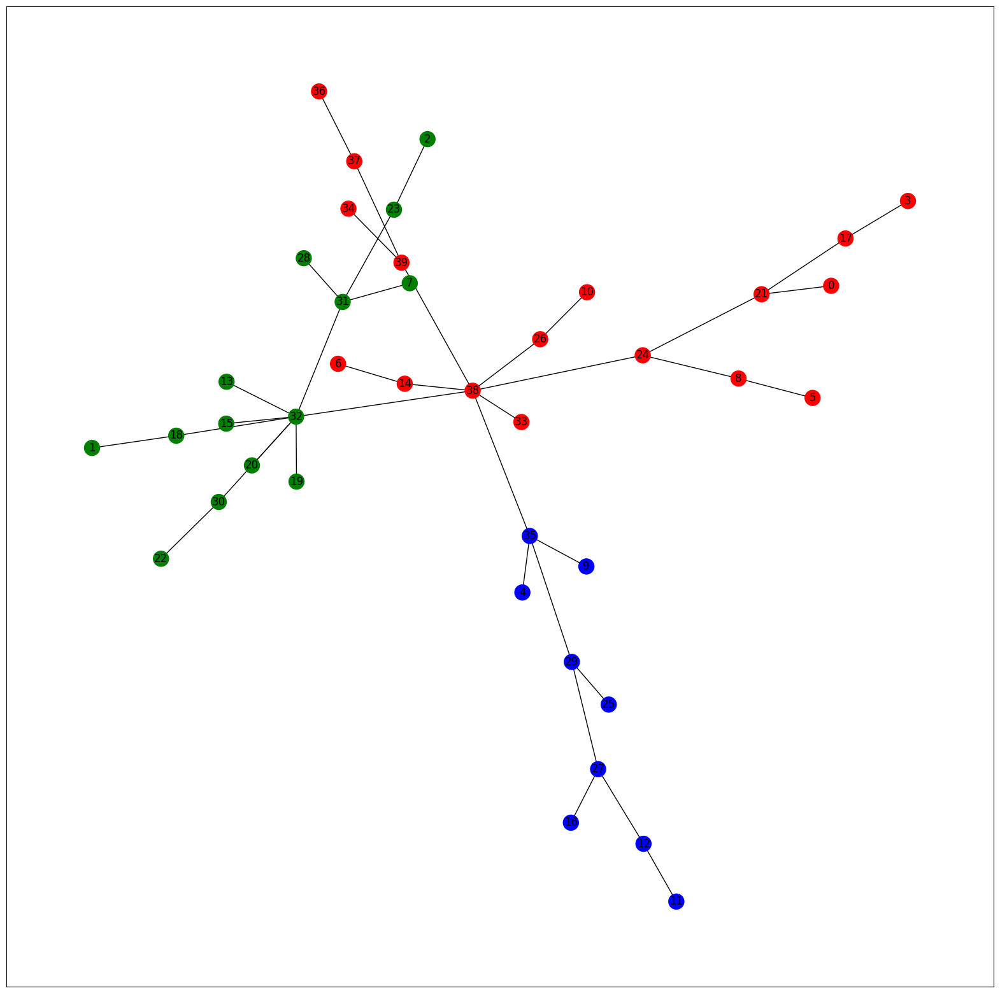

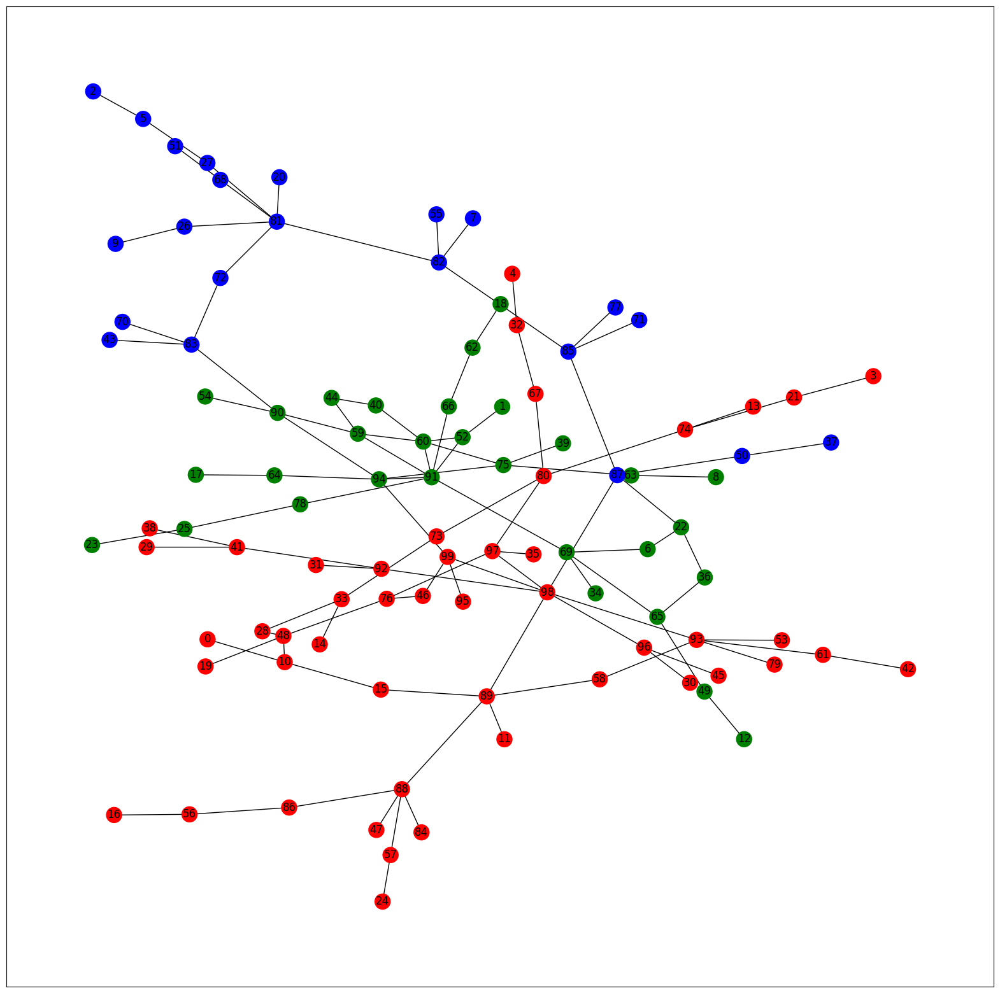

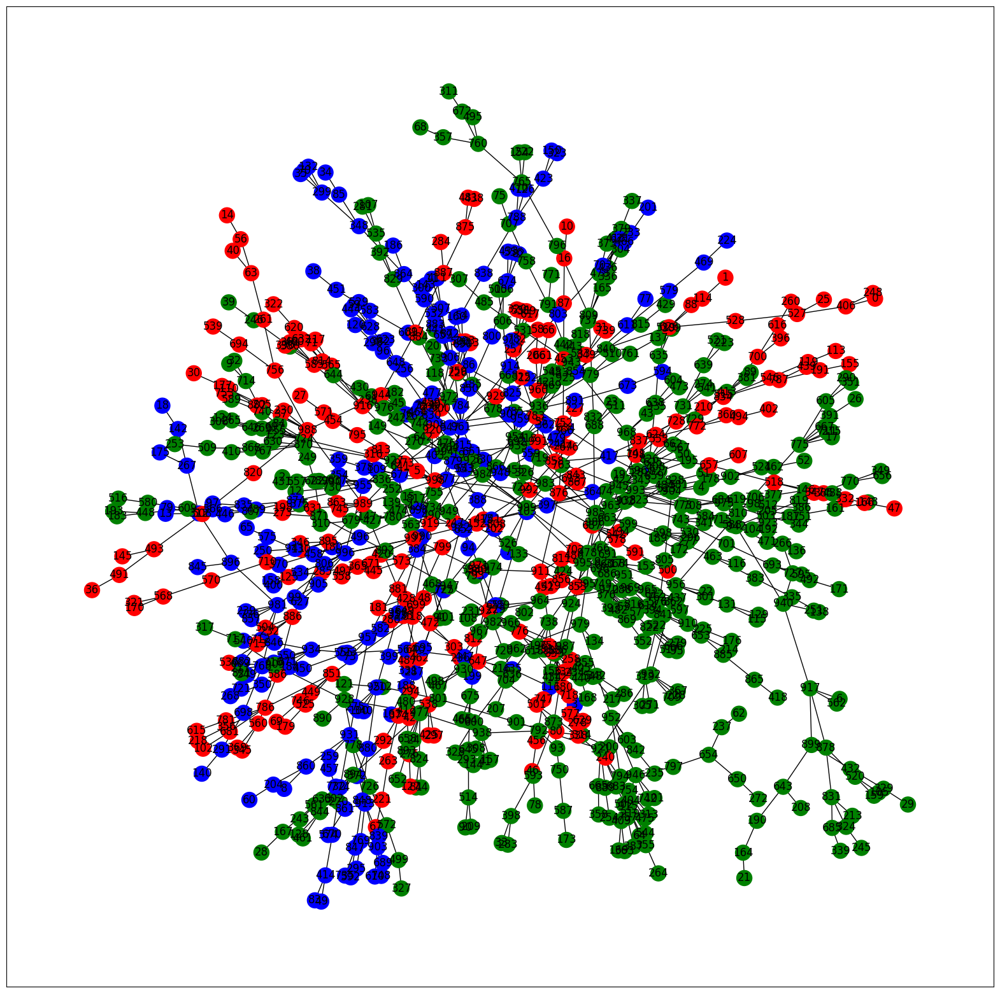

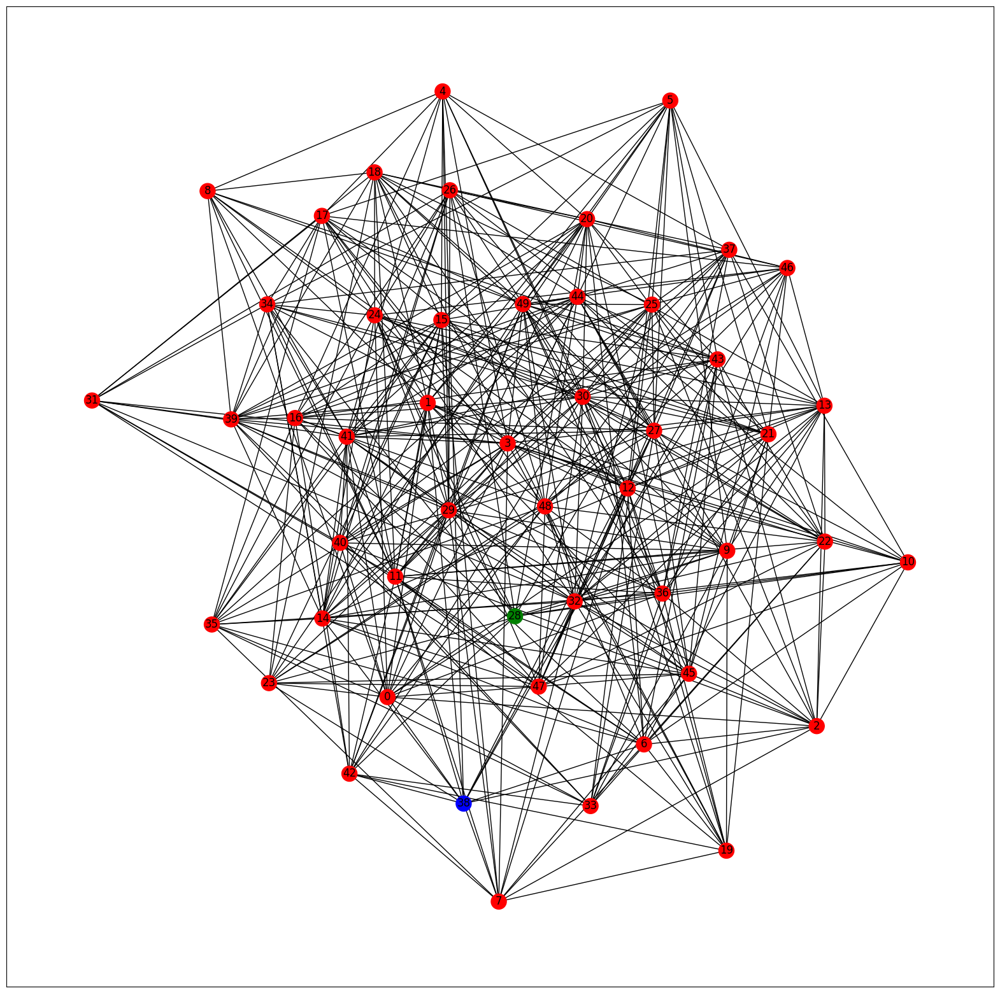

In [59]:

paths = ["./data/custom/1.gml",
         "./data/custom/2.gml",
         "./data/custom/3.gml",
         "./data/custom/4.gml",]
for path in paths:

    network = nx.read_gml(path)
    communities = gn(network.copy(), 3)
    nodes = put_together(communities)

    drawGraph(network, nodes)

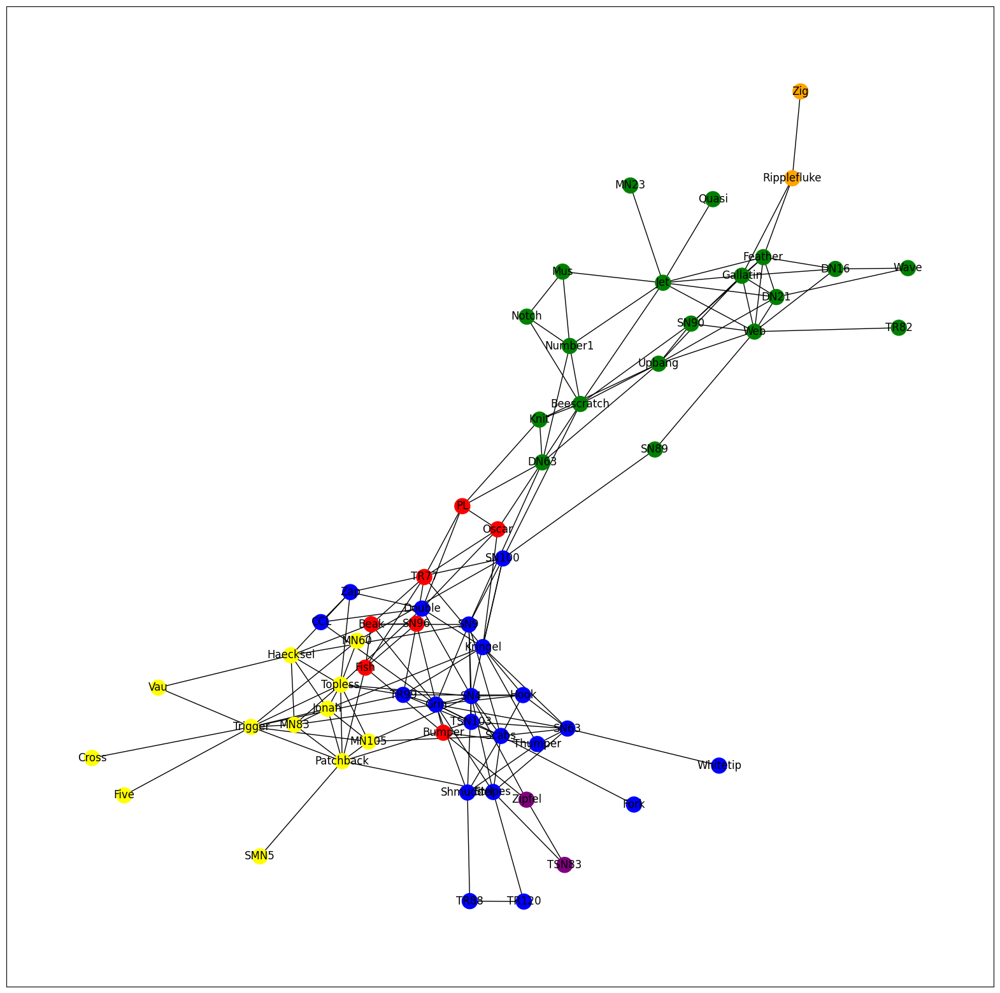

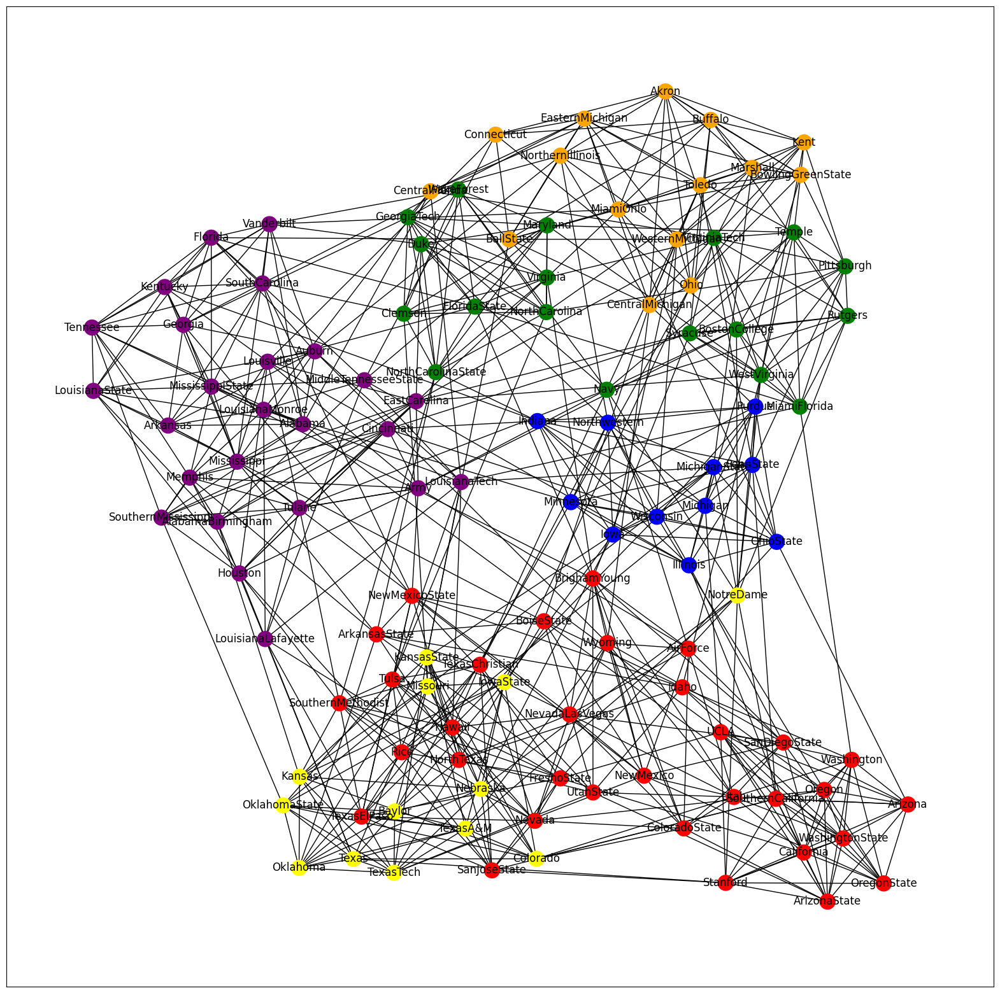

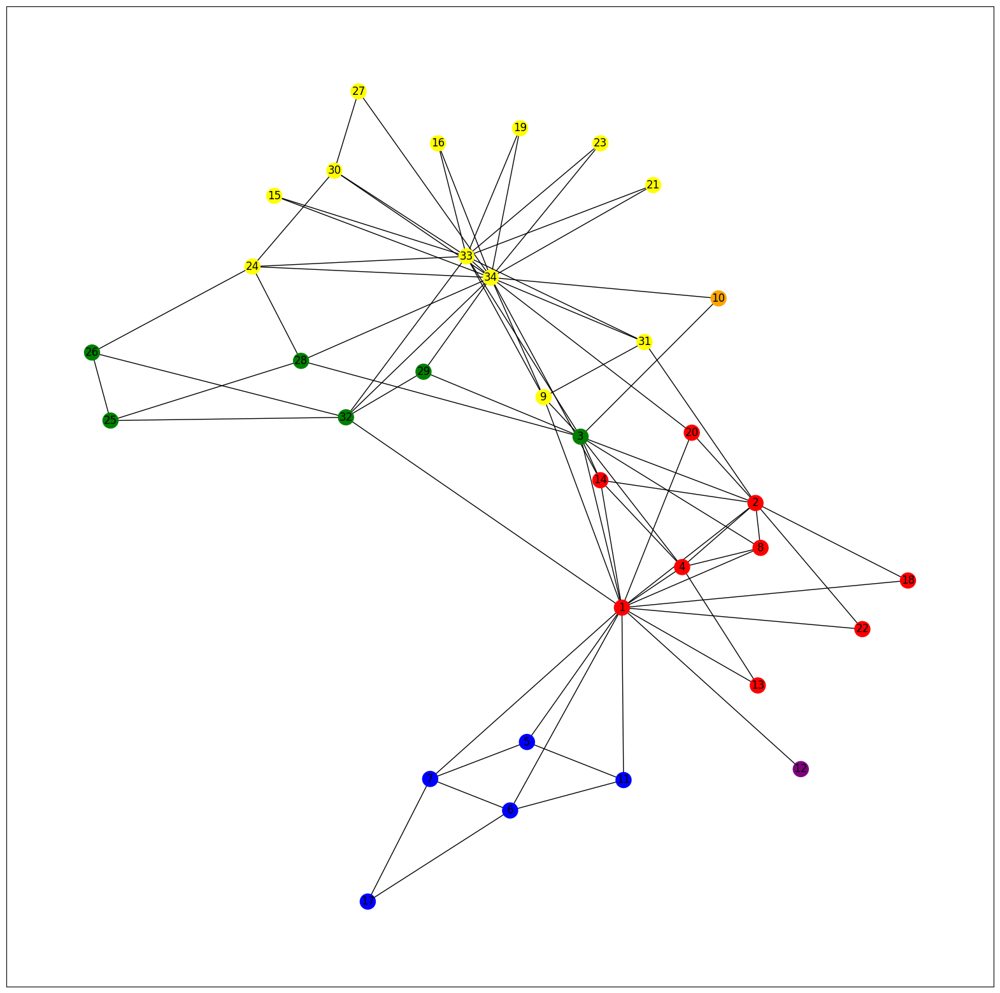

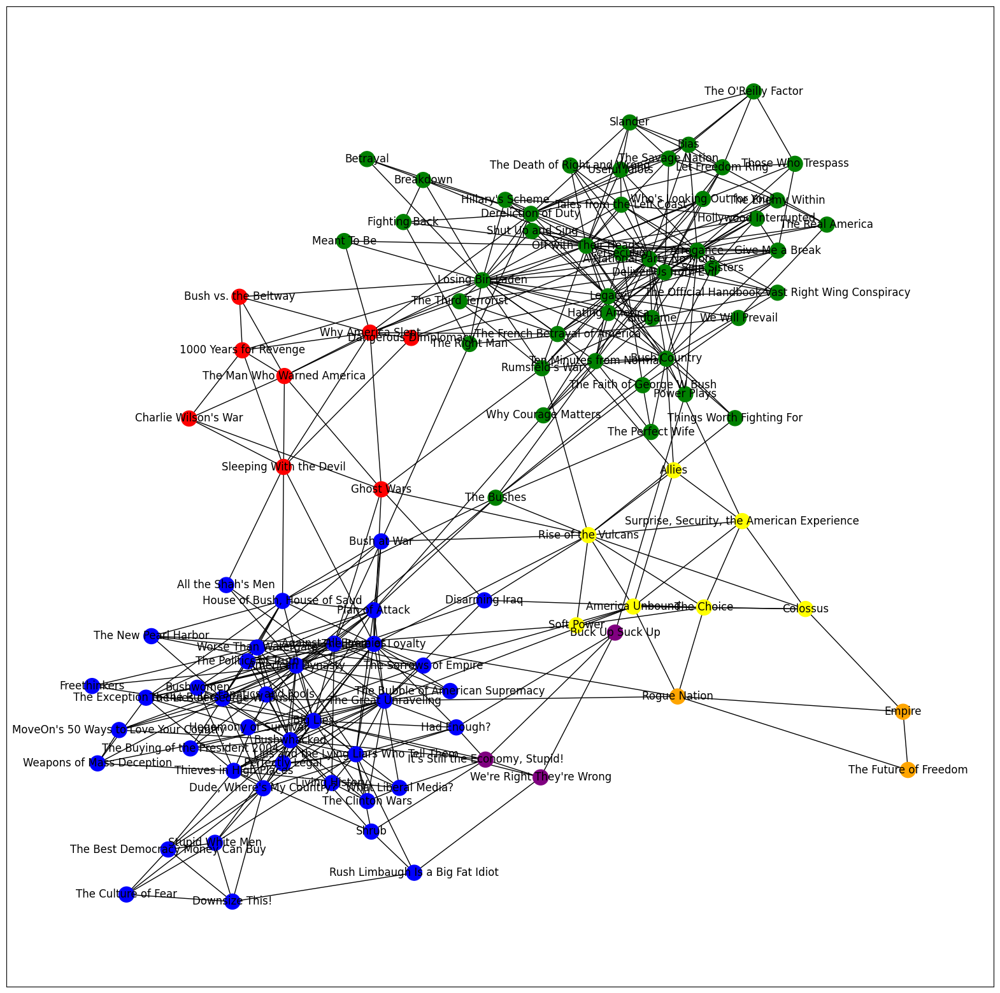

In [62]:
paths = ["./data/real/" + name + "/" + name + ".gml" for name in ["dolphins", "football", "karate", "krebs"]]

for path in paths:

    network = nx.read_gml(path)
    communities = gn(network.copy(), 6)
    nodes = put_together(communities)

    drawGraph(network, nodes)

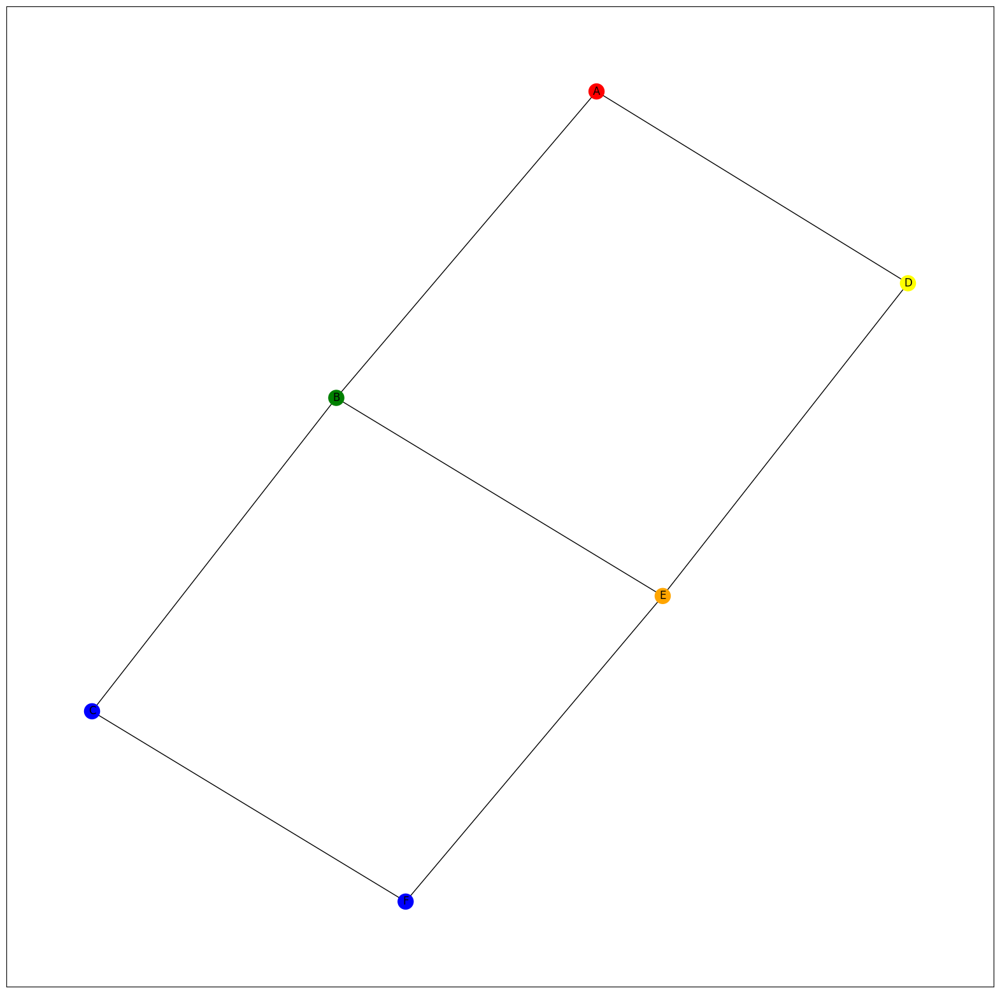

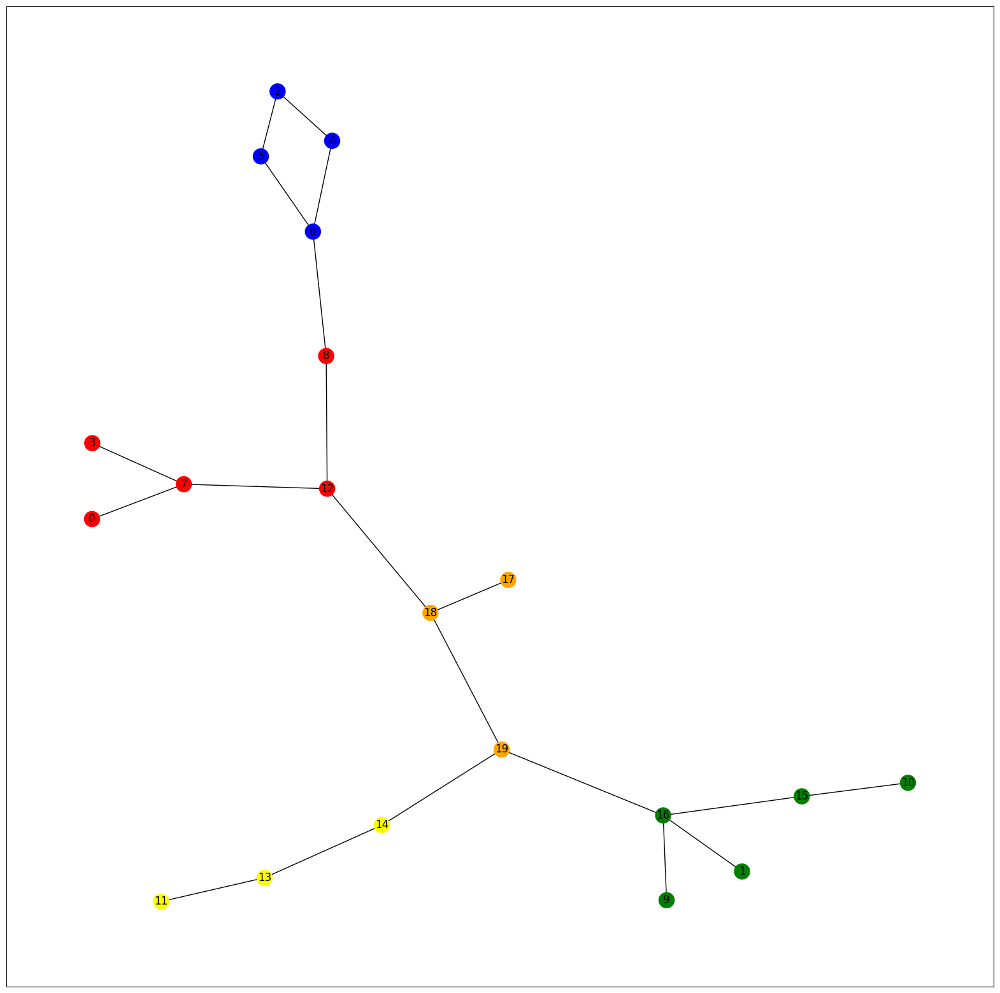

In [63]:

paths = ["./data/custom/1s.gml",
         "./data/custom/2s.gml",]
for path in paths:

    network = nx.read_gml(path)
    communities = gn(network.copy(), 5)
    nodes = put_together(communities)

    drawGraph(network, nodes)